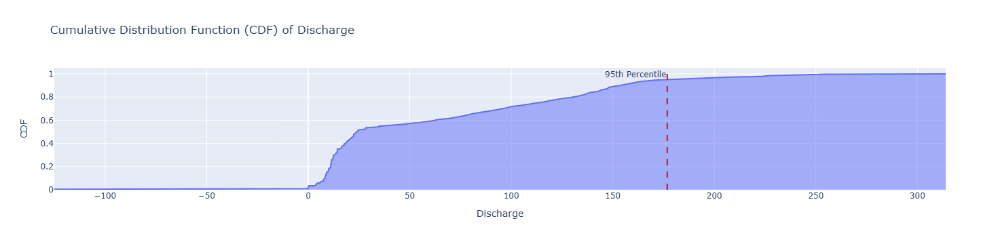

IQR test result:
1st Quartile (Q1): 11.43
3rd Quartile (Q3): 113.0
IQR: 101.57
Number of data points available: 122580
Outliers based on IQR test: 360


In [2]:
import requests
import re
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
from io import StringIO
from datetime import date
from scipy.stats import zscore
import os

# Ensure the Plotly renderer is set to JupyterLab
pio.renderers.default = 'jupyterlab'

# Define the UTDWR site ID
site_id = "10987"

# Get the current year
today = date.today()
current_year = int(today.strftime("%Y"))
start_year = 1990  # Adjust as needed

# Initialize an empty dataframe to store all years
df_all_years = pd.DataFrame()

for year in range(start_year, current_year + 1):  # Loop over years
    try:
        # Construct the URL
        URL = f"https://www.waterrights.utah.gov/cgi-bin/dvrtview.exe?STATION_ID={site_id}&RECORD_YEAR={year}&Modinfo=Daily_Comma"
        
        rr = requests.get(URL)
        temp = StringIO(rr.text)
        lines = temp.readlines()
        
        # Extract the actual data URL
        URL_end = next((re.findall('"([^"]*)"', line)[0] for line in lines if line.startswith("Daily comma delimited")), None)
        
        if not URL_end:
            continue  # Skip if no valid URL
        
        URL_full = f"https://www.waterrights.utah.gov{URL_end}"
        rrr = requests.get(URL_full)
        
        df = pd.read_csv(StringIO(rrr.text))
        
        # Skip years with unexpected column counts
        if df.shape[1] != 4:
            continue

        # Rename columns properly
        df.columns = ["year", "month", "day", "DISCHARGE"]
        df["DATE"] = pd.to_datetime(df[['year', 'month', 'day']])
        df.drop(columns=["year", "month", "day"], inplace=True)

        df_all_years = pd.concat([df_all_years, df], ignore_index=True)
    
    except Exception:
        continue  # Skip errors silently

# Add 'STATION_ID' and 'RECORD_YEAR' columns before melting the dataframe
df_all_years['STATION_ID'] = site_id  # Assign site ID to all rows
df_all_years['RECORD_YEAR'] = df_all_years['DATE'].dt.year  # Assign the year from the 'DATE' column

# Compute rate of change (grouped by year)
df_all_years['Discharge_Change'] = df_all_years.groupby('RECORD_YEAR')['DISCHARGE'].diff()

# IQR Test
Q1 = df_all_years['DISCHARGE'].quantile(0.25)
Q3 = df_all_years['DISCHARGE'].quantile(0.75)
IQR = Q3 - Q1

# Flagging outliers based on IQR
df_all_years['IQR_Outlier'] = (df_all_years['DISCHARGE'] < (Q1 - 1.5 * IQR)) | (df_all_years['DISCHARGE'] > (Q3 + 1.5 * IQR))

# Plotting CDF
# Calculate CDF
sorted_data = np.sort(df_all_years['DISCHARGE'].dropna())  # Remove NA values for CDF calculation
cdf = np.linspace(0, 1, len(sorted_data))

# Plot CDF with the 95th percentile
fig = px.area(x=sorted_data, y=cdf, labels={'x': 'Discharge', 'y': 'CDF'}, title="Cumulative Distribution Function (CDF) of Discharge")

# Calculate the 95th percentile value
percentile_95 = sorted_data[int(0.95 * len(sorted_data))]

# Add a vertical line at the 95th percentile
fig.add_vline(x=percentile_95, line=dict(color='red', dash='dash'), annotation_text="95th Percentile", annotation_position="top left")

# Show the plot
fig.show()

# Print IQR test result
print(f"IQR test result:")
print(f"1st Quartile (Q1): {Q1}")
print(f"3rd Quartile (Q3): {Q3}")
print(f"IQR: {IQR}")
print(f"Number of data points available: {df_all_years.shape[0]}")
print(f"Outliers based on IQR test: {df_all_years['IQR_Outlier'].sum()}")

CSV file saved: discharge_data.csv


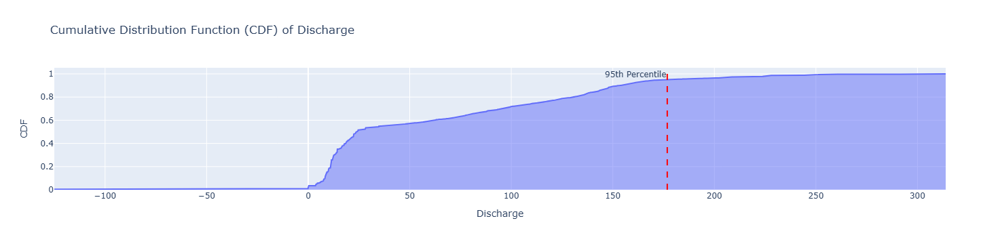

IQR test result:
1st Quartile (Q1): 11.43
3rd Quartile (Q3): 113.0
IQR: 101.57
Number of data points available: 122616
Outliers based on IQR test: 360


In [3]:
import requests
import re
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
from io import StringIO
from datetime import date
from scipy.stats import zscore
import os

# Ensure the Plotly renderer is set to JupyterLab
pio.renderers.default = 'jupyterlab'

# Define the UTDWR site ID
site_id = "10987"

# Get the current year
today = date.today()
current_year = int(today.strftime("%Y"))
start_year = 1990  # Adjust as needed

# Initialize an empty dataframe to store all years
df_all_years = pd.DataFrame()

for year in range(start_year, current_year + 1):  # Loop over years
    try:
        # Construct the URL
        URL = f"https://www.waterrights.utah.gov/cgi-bin/dvrtview.exe?STATION_ID={site_id}&RECORD_YEAR={year}&Modinfo=Daily_Comma"
        
        rr = requests.get(URL)
        temp = StringIO(rr.text)
        lines = temp.readlines()
        
        # Extract the actual data URL
        URL_end = next((re.findall('"([^"]*)"', line)[0] for line in lines if line.startswith("Daily comma delimited")), None)
        
        if not URL_end:
            continue  # Skip if no valid URL
        
        URL_full = f"https://www.waterrights.utah.gov{URL_end}"
        rrr = requests.get(URL_full)
        
        df = pd.read_csv(StringIO(rrr.text))
        
        # Skip years with unexpected column counts
        if df.shape[1] != 4:
            continue

        # Rename columns properly
        df.columns = ["year", "month", "day", "DISCHARGE"]
        df["DATE"] = pd.to_datetime(df[['year', 'month', 'day']])
        df.drop(columns=["year", "month", "day"], inplace=True)

        df_all_years = pd.concat([df_all_years, df], ignore_index=True)
    
    except Exception:
        continue  # Skip errors silently

# Add 'STATION_ID' and 'RECORD_YEAR' columns before melting the dataframe
df_all_years['STATION_ID'] = site_id  # Assign site ID to all rows
df_all_years['RECORD_YEAR'] = df_all_years['DATE'].dt.year  # Assign the year from the 'DATE' column

# Compute rate of change (grouped by year)
df_all_years['Discharge_Change'] = df_all_years.groupby('RECORD_YEAR')['DISCHARGE'].diff()

# IQR Test
Q1 = df_all_years['DISCHARGE'].quantile(0.25)
Q3 = df_all_years['DISCHARGE'].quantile(0.75)
IQR = Q3 - Q1

# Flagging outliers based on IQR
df_all_years['IQR_Outlier'] = (df_all_years['DISCHARGE'] < (Q1 - 1.5 * IQR)) | (df_all_years['DISCHARGE'] > (Q3 + 1.5 * IQR))

# Save results to CSV in the same directory as the script
csv_filename = "discharge_data.csv"
df_all_years.to_csv(csv_filename, index=False)
print(f"CSV file saved: {csv_filename}")

# Plotting CDF
# Calculate CDF
sorted_data = np.sort(df_all_years['DISCHARGE'].dropna())  # Remove NA values for CDF calculation
cdf = np.linspace(0, 1, len(sorted_data))

# Plot CDF with the 95th percentile
fig = px.area(x=sorted_data, y=cdf, labels={'x': 'Discharge', 'y': 'CDF'}, title="Cumulative Distribution Function (CDF) of Discharge")

# Calculate the 95th percentile value
percentile_95 = sorted_data[int(0.95 * len(sorted_data))]

# Add a vertical line at the 95th percentile
fig.add_vline(x=percentile_95, line=dict(color='red', dash='dash'), annotation_text="95th Percentile", annotation_position="top left")

# Show the plot
fig.show()

# Print IQR test result
print(f"IQR test result:")
print(f"1st Quartile (Q1): {Q1}")
print(f"3rd Quartile (Q3): {Q3}")
print(f"IQR: {IQR}")
print(f"Number of data points available: {df_all_years.shape[0]}")
print(f"Outliers based on IQR test: {df_all_years['IQR_Outlier'].sum()}")

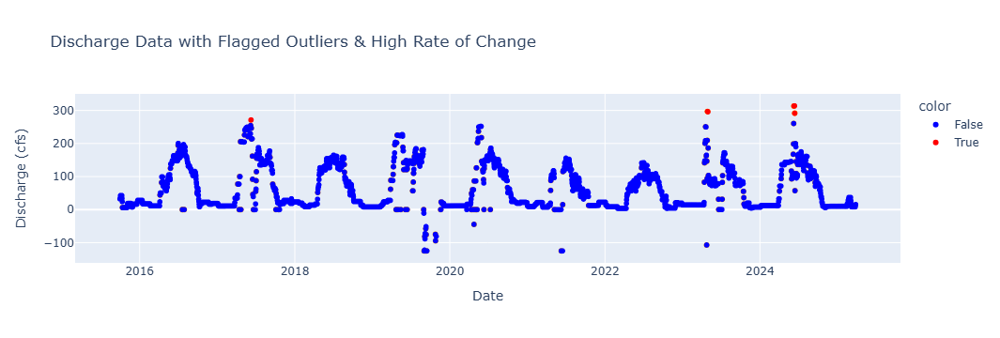

In [7]:
import requests
import re
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
from io import StringIO
from datetime import date
import os

# Ensure the Plotly renderer is set to JupyterLab
pio.renderers.default = 'jupyterlab'

# Define the UTDWR site ID
site_id = "10987"

# Get the current year
today = date.today()
current_year = int(today.strftime("%Y"))
start_year = 1990 # Adjust as needed
year=2024

# Initialize an empty dataframe to store all years
df_all_years = pd.DataFrame()

#for year in range(start_year, current_year + 1):  # Loop over years
#try:
    # Construct the URL
URL = f"https://www.waterrights.utah.gov/cgi-bin/dvrtview.exe?STATION_ID={site_id}&RECORD_YEAR={year}&Modinfo=Daily_Comma"

rr = requests.get(URL)
temp = StringIO(rr.text)
lines = temp.readlines()

# Extract the actual data URL
URL_end = next((re.findall('"([^"]*)"', line)[0] for line in lines if line.startswith("Daily comma delimited")), None)

#if not URL_end:
    #continue  # Skip if no valid URL

URL_full = f"https://www.waterrights.utah.gov{URL_end}"
rrr = requests.get(URL_full)

df = pd.read_csv(StringIO(rrr.text))

# Skip years with unexpected column counts
#if df.shape[1] != 4:
    #continue

# Rename columns properly
df.columns = ["year", "month", "day", "DISCHARGE"]
df["DATE"] = pd.to_datetime(df[['year', 'month', 'day']])
df.drop(columns=["year", "month", "day"], inplace=True)

df_all_years = pd.concat([df_all_years, df], ignore_index=True)

#except Exception:
#    continue  # Skip errors silently

# Add 'STATION_ID' and 'RECORD_YEAR' columns
df_all_years['STATION_ID'] = site_id
df_all_years['RECORD_YEAR'] = df_all_years['DATE'].dt.year

# Compute rate of change
df_all_years['Discharge_Change'] = df_all_years['DISCHARGE'].diff()

# IQR Test
Q1 = df_all_years['DISCHARGE'].quantile(0.25)
Q3 = df_all_years['DISCHARGE'].quantile(0.75)
IQR = Q3 - Q1

# Flagging outliers based on IQR
df_all_years['IQR_Outlier'] = (df_all_years['DISCHARGE'] < (Q1 - 1.5 * IQR)) | (df_all_years['DISCHARGE'] > (Q3 + 1.5 * IQR))

# Compute 95th percentile for rate of change
roc_95th_percentile = df_all_years['Discharge_Change'].abs().quantile(0.95)
df_all_years['High_Rate_Change'] = df_all_years['Discharge_Change'].abs() > roc_95th_percentile

# Save results to CSV
#csv_filename = "discharge_data.csv"
#df_all_years.to_csv(csv_filename, index=False)
#print(f"CSV file saved: {csv_filename}")

# Interactive plot
fig = px.scatter(df_all_years, x="DATE", y="DISCHARGE", title="Discharge Data with Flagged Outliers & High Rate of Change",
                 labels={"DISCHARGE": "Discharge (cfs)", "DATE": "Date"},
                 color=df_all_years['IQR_Outlier'].astype(str),  # Color based on IQR Outlier flag
                 color_discrete_map={"True": "red", "False": "blue"},
                 hover_data={"Discharge_Change": True, "IQR_Outlier": True, "High_Rate_Change": True})

# Highlight points exceeding the 95th percentile rate of change
fig.add_trace(px.scatter(df_all_years[df_all_years['High_Rate_Change']], x="DATE", y="DISCHARGE",
                         color_discrete_sequence=["orange"]).data[0])

# Show the interactive plot
fig.show()

# Print summary
#print(f"IQR test result:")
#print(f"1st Quartile (Q1): {Q1}")
#print(f"3rd Quartile (Q3): {Q3}")
#print(f"IQR: {IQR}")
#print(f"Number of data points available: {df_all_years.shape[0]}")
#print(f"Outliers based on IQR test: {df_all_years['IQR_Outlier'].sum()}")
#print(f"Data points exceeding 95th percentile rate of change: {df_all_years['High_Rate_Change'].sum()}")